# **Image Processing: Week 1 – Fondasi Citra Digital: Geometri, Warna, dan Anotasis**

Minggu ini kita akan mempelajari konsep fundamental dalam **pengolahan citra digital** dengan fokus pada representasi citra sebagai data, operasi dasar, transformasi geometris, serta anotasi visual. Teknik-teknik ini merupakan fondasi penting sebelum masuk ke analisis citra tingkat lanjut.

**Tujuan Pembelajaran:**

Di akhir sesi ini kita akan bisa:
- Memahami bagaimana gambar direpresentasikan sebagai data numerik.
- Melakukan operasi dasar citra seperti resize, crop, dan konversi warna.
- Menerapkan transformasi geometris: translasi, rotasi, dan scaling.
- Menambahkan anotasi visual (teks dan bentuk) ke citra.

> *This module is inspired by the development of last semester’s materials.* 

## **Identitas Mahasiswa**

- **Nama:** Cidesta Mentari Marintan Simbolon  
- **NIM:** 122400096  
- **Kelas:** Pengolahan Citra

## **Citra Sebagai Data**

Citra digital sebenarnya hanyalah matriks angka.
- Setiap angka = intensitas warna.
- Untuk citra berwarna, ada 3 channel: R (Red), G (Green), B (Blue).
- Untuk grayscale, cukup 1 channel.

- **Resolusi:** jumlah piksel (lebar x tinggi)
- **Color space:** RGB (warna), Grayscale (abu-abu), HSV (hue, saturation, value)

Bayangkan seperti spreadsheet Excel.
Setiap sel di sana bukan angka biasa, tapi intensitas warna piksel. Itulah yang sedang kita olah.

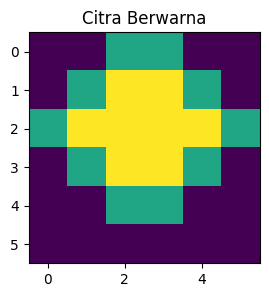

In [1]:
import numpy as np
import matplotlib.pyplot as plt

numpy_img_1ch = np.array([
    [0,   0, 150, 150, 0,   0],
    [0, 150, 255, 255,150,  0],
    [150,255,255,255,255,150],
    [0, 150,255,255,150, 0],
    [0,   0,150,150, 0,  0],
    [0,   0,  0,  0, 0,  0],
], dtype=np.uint8)

plt.figure(figsize=(3,3))
plt.imshow(numpy_img_1ch)
plt.title("Citra Berwarna")
plt.show()

>>Dari hasil percobaan yang saya lakukan, citra digital berukuran 6x6 berhasil ditampilkan menggunakan library NumPy dan Matplotlib pada Python. Citra dibuat dalam bentuk array dua dimensi dengan nilai intensitas piksel yang berbeda-beda sehingga menghasilkan tampilan berwarna pada saat divisualisasikan menggunakan fungsi `imshow()`. Perbedaan nilai piksel tersebut membentuk pola tertentu pada citra, di mana nilai yang lebih tinggi menghasilkan warna yang lebih terang sedangkan nilai yang rendah menghasilkan warna yang lebih gelap.

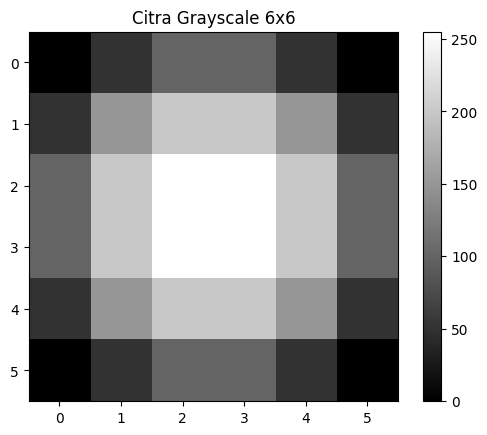

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

numpy_img_1ch = np.array([
    [0,   50,  100, 100, 50,  0],
    [50,  150, 200, 200, 150, 50],
    [100, 200, 255, 255, 200, 100],
    [100, 200, 255, 255, 200, 100],
    [50,  150, 200, 200, 150, 50],
    [0,   50,  100, 100, 50,  0],
], dtype=np.uint8)

plt.imshow(numpy_img_1ch, cmap='gray')
plt.title("Citra Grayscale 6x6")
plt.colorbar()

plt.show(block=True)

>>Dari hasil percobaan yang saya lakukan, citra grayscale berukuran 6x6 berhasil ditampilkan menggunakan library NumPy dan Matplotlib pada Python. Citra dibentuk dari array dua dimensi dengan nilai intensitas piksel yang berbeda-beda sehingga menghasilkan tingkat keabuan yang berbeda pada setiap piksel. Nilai piksel yang rendah menghasilkan warna lebih gelap, sedangkan nilai piksel yang lebih tinggi menghasilkan warna yang lebih terang. Dengan menggunakan parameter `cmap='gray'`, citra dapat divisualisasikan dalam bentuk grayscale sehingga perbedaan intensitas setiap piksel terlihat lebih jelas.

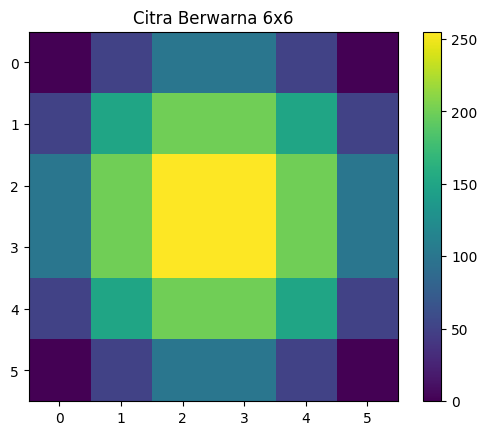

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

numpy_img_1ch = np.array([
    [0,   50,  100, 100, 50,  0],
    [50,  150, 200, 200, 150, 50],
    [100, 200, 255, 255, 200, 100],
    [100, 200, 255, 255, 200, 100],
    [50,  150, 200, 200, 150, 50],
    [0,   50,  100, 100, 50,  0],
], dtype=np.uint8)

plt.imshow(numpy_img_1ch)
plt.title("Citra Berwarna 6x6")
plt.colorbar()

plt.show(block=True)

>>Dari hasil percobaan yang saya lakukan, citra digital berukuran 6x6 berhasil ditampilkan menggunakan library NumPy dan Matplotlib pada Python. Citra dibuat dari array dua dimensi dengan nilai intensitas piksel yang berbeda-beda sehingga menghasilkan tampilan berwarna saat divisualisasikan menggunakan fungsi `imshow()`. Nilai piksel yang lebih rendah menghasilkan warna lebih gelap, sedangkan nilai piksel yang lebih tinggi menghasilkan warna yang lebih terang dan bervariasi. Selain itu, penggunaan fungsi `colorbar()` membantu menunjukkan perbedaan intensitas warna pada setiap piksel di dalam citra.

**💭 Refleksi**
- Kenapa kita perlu `cmap='gray'` saat menampilkan gambar?
- Apa maksud dari `dtype=np.uint8`?

> Coba hilangkan argumen cmap='gray' dan lihat hasilnya!

**💭 Jawaban Refleksi**
- Karena data gambar yang diatas hanya terdiri dari 1 channel (grayscale), yaitu nilai intensitas dari 0–255. Kalau tidak pakai `cmap='gray'` maka matplotlib akan memakai colormap default. Jadi `cmap='gray'` memastikan gambar benar-benar tampil sebagai citra grayscale yang sesuai konsep pengolahan citra.

- `dtype=np.uint8` berarti tipe data pixel yang artinya 8-bit unsigned integer dengan rentang 0–255 merupakan standar nilai intensitas citra digital (0 = hitam, 255 = putih).

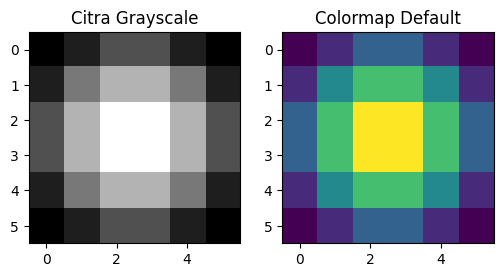

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

numpy_img_1ch = np.array([
    [0,   30,  80,  80,  30,  0],
    [30,  120, 180, 180, 120, 30],
    [80,  180, 255, 255, 180, 80],
    [80,  180, 255, 255, 180, 80],
    [30,  120, 180, 180, 120, 30],
    [0,   30,  80,  80,  30,  0],
], dtype=np.uint8)

fig, axs = plt.subplots(1, 2, figsize=(6,3))

axs[0].imshow(numpy_img_1ch, cmap='gray')
axs[0].set_title("Citra Grayscale")

axs[1].imshow(numpy_img_1ch)
axs[1].set_title("Colormap Default")

plt.show()

>>Dari hasil percobaan yang saya lakukan, citra digital 6x6 berhasil ditampilkan menggunakan dua jenis visualisasi yang berbeda, yaitu grayscale dan colormap default. Pada tampilan grayscale, citra terlihat dalam bentuk tingkat keabuan berdasarkan nilai intensitas piksel, di mana nilai rendah menghasilkan warna lebih gelap dan nilai tinggi menghasilkan warna lebih terang. Sedangkan pada tampilan colormap default, citra divisualisasikan dengan variasi warna otomatis dari Matplotlib sehingga tampak lebih berwarna. Perbedaan kedua tampilan tersebut menunjukkan bahwa penggunaan parameter `cmap='gray'` memengaruhi representasi warna pada citra digital yang ditampilkan.

Channel Merah:
 [[255   0   0 128   0   0]
 [  0   0   0 128   0   0]
 [  0   0   0 128   0   0]
 [128 128 128 128 128 128]
 [  0   0   0 128   0   0]
 [  0   0   0 128   0 255]]
Channel Hijau:
 [[255   0   0   0   0   0]
 [  0   0   0   0   0   0]
 [  0   0   0   0   0   0]
 [  0   0   0   0   0   0]
 [  0   0   0   0   0   0]
 [  0   0   0   0   0   0]]
Channel Biru:
 [[255 255 255 128 255 255]
 [255 255 255 128 255 255]
 [255 255 255 128 255 255]
 [128 128 128 128 128 128]
 [255 255 255 128 255 255]
 [255 255 255 128 255   0]]


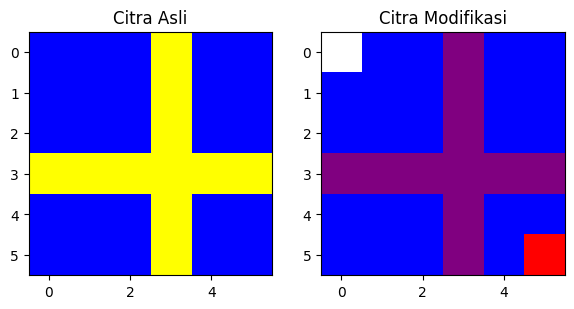

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Membuat citra RGB 6x6
numpy_img_rgb = np.zeros((6, 6, 3), dtype=np.uint8)

# Set background biru
numpy_img_rgb[:, :] = [0, 0, 255]

# Membuat garis silang warna kuning
numpy_img_rgb[3, :] = [255, 255, 0]
numpy_img_rgb[:, 3] = [255, 255, 0]

# Salin untuk modifikasi
numpy_img_rgb_modified = numpy_img_rgb.copy()

# Mengubah garis silang menjadi ungu
numpy_img_rgb_modified[3, :] = [128, 0, 128]
numpy_img_rgb_modified[:, 3] = [128, 0, 128]

# Menambahkan titik putih dan merah
numpy_img_rgb_modified[0, 0] = [255, 255, 255]
numpy_img_rgb_modified[5, 5] = [255, 0, 0]

# Menampilkan channel RGB
print("Channel Merah:\n", numpy_img_rgb_modified[:, :, 0])
print("Channel Hijau:\n", numpy_img_rgb_modified[:, :, 1])
print("Channel Biru:\n", numpy_img_rgb_modified[:, :, 2])

# Plot citra
fig, axs = plt.subplots(1, 2, figsize=(6,3))

axs[0].imshow(numpy_img_rgb)
axs[0].set_title("Citra Asli")

axs[1].imshow(numpy_img_rgb_modified)
axs[1].set_title("Citra Modifikasi")

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, citra RGB berhasil dibuat menggunakan array tiga dimensi pada library NumPy. Citra awal memiliki background berwarna biru dengan pola garis silang berwarna kuning di bagian tengah. Setelah dilakukan modifikasi, warna garis diubah menjadi ungu serta ditambahkan beberapa titik dengan warna berbeda seperti putih dan merah. Perubahan nilai RGB pada setiap piksel memengaruhi warna yang ditampilkan pada citra. Selain itu, hasil channel merah, hijau, dan biru menunjukkan bahwa setiap warna pada citra tersusun dari kombinasi intensitas ketiga channel tersebut.

## **Operasi Dasar Citra**

Pada sesi ini, kita akan melakukan muat gambar, menampilkan, *resizing, cropping,* konversi warna, dan memisahkan channel warna.

### **Hands-On: 1. *Load* Gambar**

Muat gambar dengan `cv2.imread()` dan tampilkan dengan `matplotlib`. Langkah-langkahnya:

1. **Import Library**: Pastikan `cv2` dan `os` sudah di-import.
2. **Path Gambar**: Gunakan `os.path.join` untuk path yang kompatibel di semua OS.
3. **Load Gambar**: Pakai `cv2.imread(path)`, hasilnya array numpy.
4. **Tampilkan**: Gunakan `cv2.imshow` atau `matplotlib`.

> **Tips**: `os.path.join` bikin path lebih aman dan fleksibel di berbagai sistem operasi.


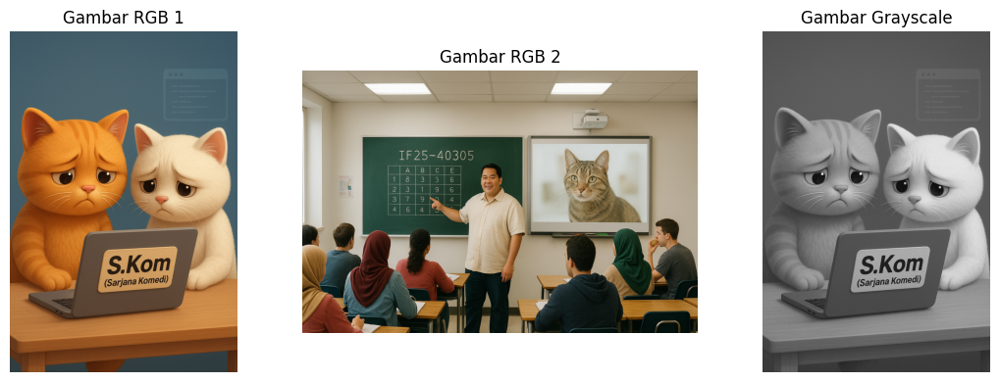

In [1]:
import cv2
import os
import matplotlib.pyplot as plt

# Path gambar
img1_path = os.path.join(os.getcwd(), 'data', 'sample1.png')
img2_path = os.path.join(os.getcwd(), 'data', 'sample2.png')

# Membaca gambar
img1 = cv2.imread(img1_path)
img2 = cv2.imread(img2_path)

# Konversi BGR ke RGB
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Konversi grayscale
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

# Plot gambar
fig, axs = plt.subplots(1, 3, figsize=(12,4))

axs[0].imshow(img1_rgb)
axs[0].set_title("Gambar RGB 1")
axs[0].axis('off')

axs[1].imshow(img2_rgb)
axs[1].set_title("Gambar RGB 2")
axs[1].axis('off')

axs[2].imshow(img1_gray, cmap='gray')
axs[2].set_title("Gambar Grayscale")
axs[2].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil dibaca menggunakan library OpenCV dan divisualisasikan menggunakan Matplotlib. Gambar yang awalnya dibaca dalam format BGR kemudian dikonversi menjadi RGB agar warna yang ditampilkan sesuai dengan warna asli gambar. Selain itu, dilakukan juga konversi citra menjadi grayscale sehingga gambar hanya menampilkan tingkat keabuan tanpa warna. Hasil percobaan menunjukkan bahwa format warna pada citra memengaruhi tampilan visual gambar yang dihasilkan.

> **Pertanyaan:** Mengapa kita harus melakukan `cv2.cvtColor cv2.COLOR_BGR2RGB`?

> **Jawaban** Konversi `cv2.cvtColor(img, cv2.COLOR_BGR2RGB)` perlu dilakukan karena OpenCV membaca gambar dalam format BGR, sedangkan Matplotlib menampilkan gambar dalam format RGB. Jika tidak dikonversi, maka warna pada gambar akan terlihat tertukar dan tidak sesuai dengan warna aslinya.

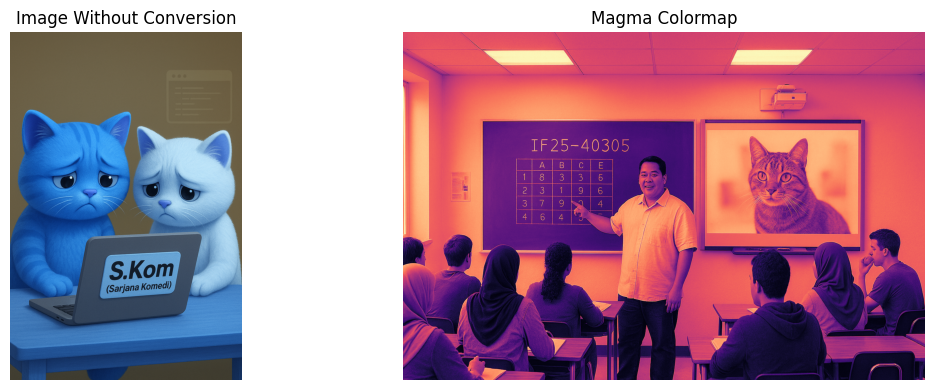

In [6]:
import cv2
import os
import matplotlib.pyplot as plt

# Path gambar
img1_path = os.path.join(os.getcwd(), 'data', 'sample1.png')
img2_path = os.path.join(os.getcwd(), 'data', 'sample2.png')

# Membaca gambar tanpa konversi RGB
img1_bgr = cv2.imread(img1_path)
img2_bgr = cv2.imread(img2_path)

# Menampilkan gambar
fig, axs = plt.subplots(1, 2, figsize=(12,4))

axs[0].imshow(img1_bgr)
axs[0].set_title("Image Without Conversion")
axs[0].axis('off')

axs[1].imshow(img2_bgr[:, :, 1], cmap='magma')
axs[1].set_title("Magma Colormap")
axs[1].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil ditampilkan menggunakan OpenCV dan Matplotlib tanpa melakukan konversi warna dari format BGR ke RGB. Pada gambar pertama, warna terlihat berubah dari warna aslinya karena terjadi pertukaran channel warna antara biru dan merah. Sedangkan pada gambar kedua digunakan colormap `magma` sehingga citra memiliki tampilan warna ungu, merah, dan oranye berdasarkan intensitas piksel yang dimiliki gambar. Hasil percobaan menunjukkan bahwa format warna dan penggunaan colormap sangat memengaruhi tampilan visual citra digital yang dihasilkan.

In [7]:
# Menyimpan gambar hasil proses
import os
import cv2

# Menentukan folder output
save_folder = os.path.dirname(img1_path)

# Menyimpan gambar dalam format berbeda
cv2.imwrite(os.path.join(save_folder, 'hasil_gambar.png'), img1_bgr)
cv2.imwrite(os.path.join(save_folder, 'hasil_gambar.bmp'), img1_bgr)

# Menyimpan JPEG dengan kualitas berbeda
cv2.imwrite(os.path.join(save_folder, 'gambar_high_quality.jpg'),
            img1_bgr,
            [cv2.IMWRITE_JPEG_QUALITY, 90])

cv2.imwrite(os.path.join(save_folder, 'gambar_low_quality.jpg'),
            img1_bgr,
            [cv2.IMWRITE_JPEG_QUALITY, 25])

print("Gambar berhasil disimpan")

Gambar berhasil disimpan


In [119]:
# Menyimpan gambar
# Tentukan folder output
output_folder = os.path.dirname(img_path)

# Simpan gambar dalam berbagai format
cv2.imwrite(os.path.join(output_folder, 'gambar_output.jpg'), img_bgr)
cv2.imwrite(os.path.join(output_folder, 'gambar_output.png'), img_bgr)

# Mengontrol kualitas JPEG (0-100)
cv2.imwrite(os.path.join(output_folder, 'gambar_kualitas_tinggi.jpg'), img_bgr, [cv2.IMWRITE_JPEG_QUALITY, 95])
cv2.imwrite(os.path.join(output_folder, 'gambar_kualitas_rendah.jpg'), img_bgr, [cv2.IMWRITE_JPEG_QUALITY, 30])

True

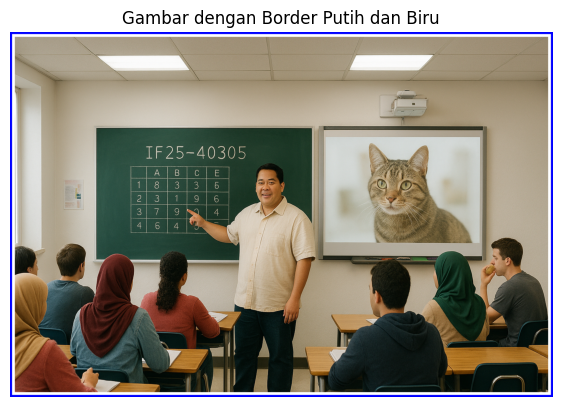

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Ukuran border
border_white = 8
border_blue = 6

# Dimensi gambar asli
height, width, channels = img2_rgb.shape

# Membuat border putih
img_with_white_border = np.ones(
    (height + 2 * border_white,
     width + 2 * border_white,
     channels),
    dtype=np.uint8
) * 255

img_with_white_border[
    border_white:-border_white,
    border_white:-border_white
] = img2_rgb

# Membuat border biru
img_with_blue_border = np.zeros(
    (height + 2 * (border_white + border_blue),
     width + 2 * (border_white + border_blue),
     channels),
    dtype=np.uint8
)

img_with_blue_border[:, :] = [0, 0, 255]

img_with_blue_border[
    border_blue:-border_blue,
    border_blue:-border_blue
] = img_with_white_border

# Menampilkan hasil
plt.figure(figsize=(7,7))
plt.imshow(img_with_blue_border)
plt.title("Gambar dengan Border Putih dan Biru")
plt.axis('off')

plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil dimodifikasi dengan penambahan border berwarna putih dan biru menggunakan array NumPy. Border pertama dibuat dengan warna putih di sekeliling gambar asli, kemudian ditambahkan border kedua berwarna biru pada bagian luar gambar. Penambahan border dilakukan dengan membuat array baru yang memiliki ukuran lebih besar dari gambar asli, kemudian gambar ditempatkan di bagian tengah array tersebut. Hasil percobaan menunjukkan bahwa manipulasi dimensi array dapat digunakan untuk menambahkan efek visual berupa bingkai pada citra digital.

Shape Gambar: (1024, 1536, 3)


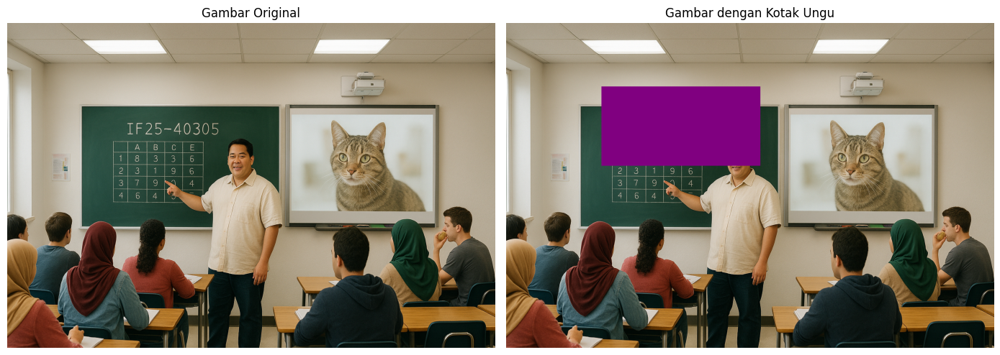

In [9]:
from IPython.display import display
import matplotlib.pyplot as plt

# Menampilkan ukuran gambar
print("Shape Gambar:", img2_rgb.shape)

# Koordinat area manipulasi
x1, y1 = 300, 200
x2, y2 = 800, 450

# Menyalin gambar
img2_rgb_box = img2_rgb.copy()

# Mengubah area tertentu menjadi warna ungu
img2_rgb_box[y1:y2, x1:x2] = [128, 0, 128]

# Menampilkan gambar
fig, axs = plt.subplots(1, 2, figsize=(14,6))

# Gambar asli
axs[0].imshow(img2_rgb)
axs[0].set_title("Gambar Original")
axs[0].axis('off')

# Gambar hasil manipulasi
axs[1].imshow(img2_rgb_box)
axs[1].set_title("Gambar dengan Kotak Ungu")
axs[1].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil dimanipulasi dengan mengubah warna pada area tertentu menggunakan koordinat piksel. Area gambar yang berada pada koordinat tertentu diubah menjadi warna ungu dengan memodifikasi nilai RGB pada array citra. Proses manipulasi dilakukan setelah gambar asli disalin menggunakan fungsi `copy()` sehingga gambar asli tidak berubah. Hasil percobaan menunjukkan bahwa perubahan nilai RGB pada koordinat tertentu dapat digunakan untuk menambahkan objek atau efek warna pada citra digital.

### **Hands-On: 2. *Resize* (Mengubah Ukuran Gambar)**

*Resize* adalah proses **mengubah dimensi gambar** sesuai kebutuhan. Proses ini sering dilakukan untuk:

- Mengurangi ukuran file gambar  
- Menyesuaikan dengan resolusi layar atau halaman web  
- Normalisasi ukuran input untuk model pembelajaran mesin  

**Cara Kerja:**
- Fungsi utama: `cv2.resize()`
- Parameter utama: `(width, height)` dalam bentuk tuple
- Pemilihan **metode interpolasi** berpengaruh pada kualitas hasil:
  - `cv2.INTER_LINEAR` → default, baik untuk memperbesar
  - `cv2.INTER_AREA` → terbaik untuk memperkecil
  - `cv2.INTER_CUBIC` dan `cv2.INTER_LANCZOS4` → kualitas tinggi, lebih halus untuk memperbesar


Shape gambar: (1024, 1536, 3)
Tinggi: 1024 piksel
Lebar: 1536 piksel
Jumlah channel: 3 (RGB)


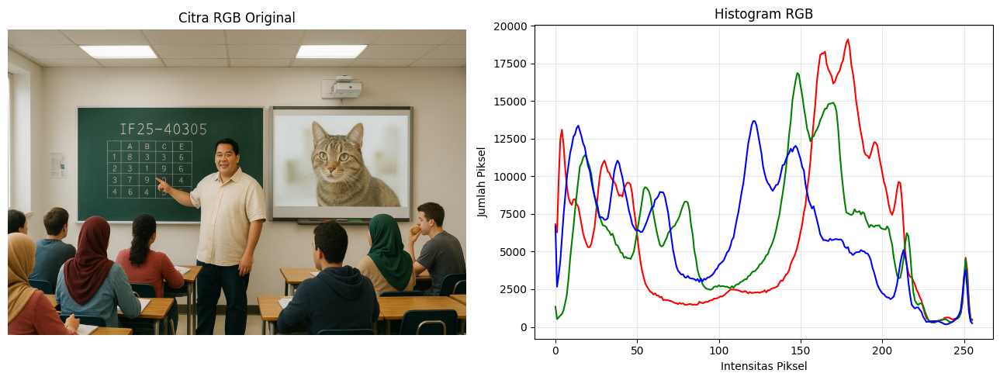

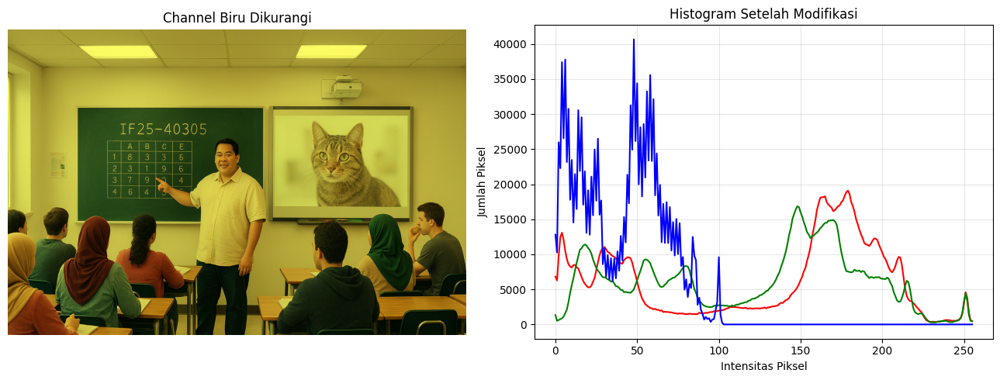


=== Penjelasan Histogram ===
Histogram digunakan untuk melihat distribusi intensitas warna pada citra RGB.
Setiap channel warna memiliki grafik intensitas masing-masing.


In [10]:
# Mengecek shape gambar
print("Shape gambar:", img2_rgb.shape)
print("Tinggi:", img2_rgb.shape[0], "piksel")
print("Lebar:", img2_rgb.shape[1], "piksel")
print("Jumlah channel:", img2_rgb.shape[2], "(RGB)")

# Menampilkan gambar dan histogram
fig, axs = plt.subplots(1, 2, figsize=(13,5))

# Gambar asli
axs[0].imshow(img2_rgb)
axs[0].set_title("Citra RGB Original")
axs[0].axis('off')

# Histogram RGB
colors = ('r', 'g', 'b')

for i, color in enumerate(colors):
    hist = cv2.calcHist([img2_rgb], [i], None, [256], [0,256])
    axs[1].plot(hist, color=color)

axs[1].set_title("Histogram RGB")
axs[1].set_xlabel("Intensitas Piksel")
axs[1].set_ylabel("Jumlah Piksel")
axs[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Modifikasi channel biru
img2_mod = img2_rgb.copy()
img2_mod[:,:,2] = (img2_mod[:,:,2] * 0.4).astype(np.uint8)

# Menampilkan hasil modifikasi
fig, axs = plt.subplots(1, 2, figsize=(13,5))

# Gambar hasil modifikasi
axs[0].imshow(img2_mod)
axs[0].set_title("Channel Biru Dikurangi")
axs[0].axis('off')

# Histogram hasil modifikasi
for i, color in enumerate(colors):
    hist = cv2.calcHist([img2_mod], [i], None, [256], [0,256])
    axs[1].plot(hist, color=color)

axs[1].set_title("Histogram Setelah Modifikasi")
axs[1].set_xlabel("Intensitas Piksel")
axs[1].set_ylabel("Jumlah Piksel")
axs[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Penjelasan histogram
print("\n=== Penjelasan Histogram ===")
print("Histogram digunakan untuk melihat distribusi intensitas warna pada citra RGB.")
print("Setiap channel warna memiliki grafik intensitas masing-masing.")

>>Dari hasil percobaan yang saya lakukan, citra digital berhasil dianalisis berdasarkan ukuran gambar, jumlah channel warna, serta distribusi intensitas piksel menggunakan histogram RGB. Histogram menunjukkan persebaran warna merah, hijau, dan biru pada citra asli. Selanjutnya dilakukan modifikasi dengan mengurangi intensitas channel biru sehingga tampilan gambar menjadi lebih sedikit warna kebiruannya. Perubahan tersebut juga memengaruhi bentuk histogram pada channel biru, di mana jumlah intensitas piksel menjadi lebih rendah dibandingkan sebelumnya. Hasil percobaan menunjukkan bahwa perubahan nilai pada channel warna tertentu dapat memengaruhi tampilan visual dan distribusi intensitas warna pada citra digital.

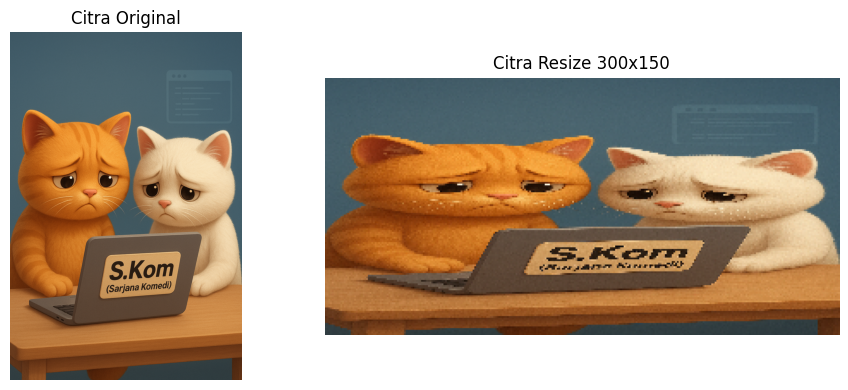

In [12]:
import cv2
import os
import matplotlib.pyplot as plt

# Path gambar
img_path = os.path.join(os.getcwd(), 'data', 'sample1.png')

# Membaca gambar
img = cv2.imread(img_path)

# Konversi gambar asli ke RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Resize gambar
img_resize = cv2.resize(img, (300, 150))

# Konversi hasil resize ke RGB
img_resize_rgb = cv2.cvtColor(img_resize, cv2.COLOR_BGR2RGB)

# Menampilkan gambar
fig, axs = plt.subplots(1, 2, figsize=(10,4))

# Gambar asli
axs[0].imshow(img_rgb)
axs[0].set_title("Citra Original")
axs[0].axis('off')

# Gambar resize
axs[1].imshow(img_resize_rgb)
axs[1].set_title("Citra Resize 300x150")
axs[1].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil diubah ukurannya menggunakan fungsi `cv2.resize()`. Proses resizing dilakukan dengan mengubah dimensi gambar menjadi 300x150 piksel sehingga ukuran gambar menjadi lebih kecil dibandingkan gambar asli. Setelah dilakukan resize, gambar dikonversi dari format BGR ke RGB agar warna yang ditampilkan sesuai dengan warna aslinya pada Matplotlib. Hasil percobaan menunjukkan bahwa proses resizing dapat digunakan untuk menyesuaikan ukuran citra digital tanpa mengubah isi utama gambar tersebut.

### **Hands-On: 3. *Crop* (Memotong Gambar)**
*Crop* adalah proses memotong bagian tertentu dari gambar, seperti memperbesar objek tertentu atau menghilangkan latar belakang yang tidak diperlukan.

**Cara Kerja:**
- Gambar direpresentasikan sebagai array numpy dengan format `[height, width, channels]`.
- *Crop* dilakukan dengan slicing array numpy:
  - `cropped_image = image[y1:y2, x1:x2]`
  - `y1`, `y2` adalah batas vertikal, dan `x1`, `x2` adalah batas horizontal.


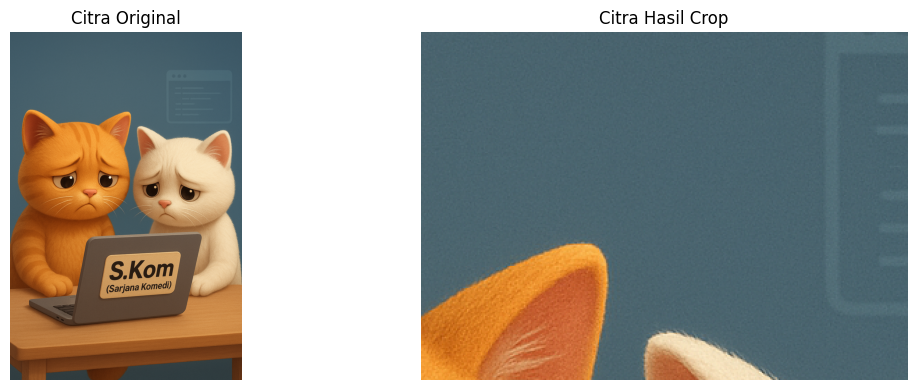

In [13]:
import cv2
import os
import matplotlib.pyplot as plt

# Path gambar
img_path = os.path.join(os.getcwd(), 'data', 'sample1.png')

# Membaca gambar
img = cv2.imread(img_path)

# Konversi gambar asli ke RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Melakukan cropping
img_crop = img[200:450, 400:750]

# Konversi hasil crop ke RGB
img_crop_rgb = cv2.cvtColor(img_crop, cv2.COLOR_BGR2RGB)

# Menampilkan gambar
fig, axs = plt.subplots(1, 2, figsize=(12,4))

# Gambar asli
axs[0].imshow(img_rgb)
axs[0].set_title("Citra Original")
axs[0].axis('off')

# Gambar hasil crop
axs[1].imshow(img_crop_rgb)
axs[1].set_title("Citra Hasil Crop")
axs[1].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil dipotong menggunakan teknik cropping pada koordinat tertentu. Proses cropping dilakukan dengan mengambil sebagian area gambar berdasarkan nilai koordinat baris dan kolom sehingga hanya bagian tertentu dari gambar yang ditampilkan. Setelah dilakukan cropping, gambar dikonversi dari format BGR ke RGB agar warna yang ditampilkan sesuai dengan warna aslinya pada Matplotlib. Hasil percobaan menunjukkan bahwa teknik cropping dapat digunakan untuk mengambil area penting tertentu pada citra digital tanpa menampilkan keseluruhan gambar.

**Latihan**
Di bawah ini, kita akan coba untuk memotong gambar menjadi setengah tingginya.

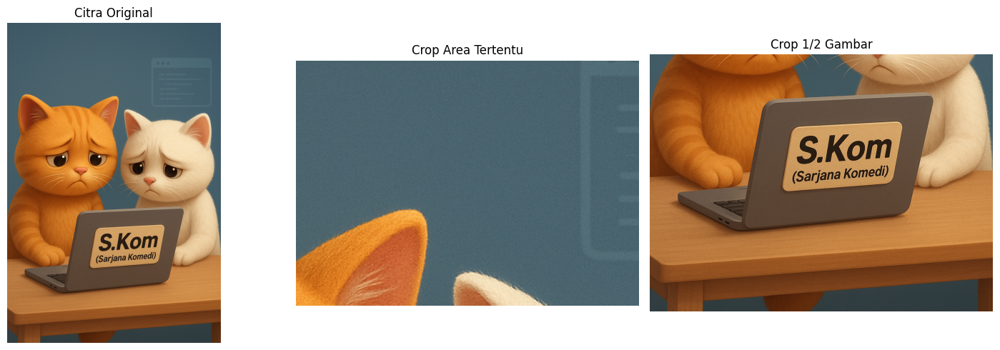

In [14]:
import cv2
import os
import matplotlib.pyplot as plt

# Path gambar
img_path = os.path.join(os.getcwd(), 'data', 'sample1.png')

# Membaca gambar
img = cv2.imread(img_path)

# Konversi gambar asli ke RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Crop area tertentu
img_crop = img[200:450, 400:750]

# Crop setengah bagian bawah gambar
img_half_crop = img[img.shape[0]//2:, :]

# Menampilkan gambar
fig, axs = plt.subplots(1, 3, figsize=(15,5))

# Gambar asli
axs[0].imshow(img_rgb)
axs[0].set_title("Citra Original")
axs[0].axis('off')

# Hasil crop area tertentu
axs[1].imshow(cv2.cvtColor(img_crop, cv2.COLOR_BGR2RGB))
axs[1].set_title("Crop Area Tertentu")
axs[1].axis('off')

# Hasil crop setengah gambar
axs[2].imshow(cv2.cvtColor(img_half_crop, cv2.COLOR_BGR2RGB))
axs[2].set_title("Crop 1/2 Gambar")
axs[2].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil dipotong menggunakan dua metode cropping yang berbeda. Metode pertama dilakukan dengan mengambil area tertentu berdasarkan koordinat piksel sehingga hanya bagian tertentu dari gambar yang ditampilkan. Metode kedua dilakukan dengan mengambil setengah bagian bawah gambar menggunakan pembagian ukuran tinggi citra. Setelah proses cropping, gambar dikonversi dari format BGR ke RGB agar warna yang ditampilkan sesuai dengan warna aslinya pada Matplotlib. Hasil percobaan menunjukkan bahwa teknik cropping dapat digunakan untuk mengambil bagian tertentu dari citra digital sesuai kebutuhan pengguna.

### **Hands-On: 4. *Flip* (Membalik Gambar)**

*Flip* adalah proses membalik gambar secara horizontal, vertikal, atau keduanya. Proses ini sering digunakan untuk augmentasi data atau untuk mencerminkan gambar.

**Cara Kerja:**
- Gambar direpresentasikan sebagai array numpy dengan format `[height, width, channels]`.
- *Flip* dilakukan menggunakan fungsi `cv2.flip()`:
    - `cv2.flip(image, 0)` → Membalik gambar secara vertikal.
    - `cv2.flip(image, 1)` → Membalik gambar secara horizontal.
    - `cv2.flip(image, -1)` → Membalik gambar secara horizontal dan vertikal.

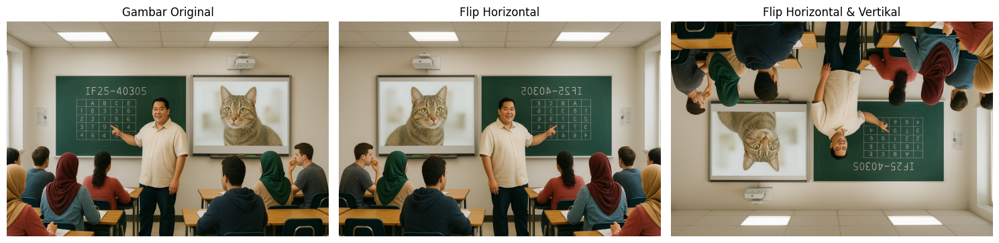

In [16]:
import cv2
import os
import matplotlib.pyplot as plt

# Path gambar
img_path = os.path.join(os.getcwd(), 'data', 'sample2.png')

# Membaca gambar
img = cv2.imread(img_path)

# Konversi RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Flip gambar
img_flip_horizontal = cv2.flip(img_rgb, 1)
img_flip_both = cv2.flip(img_rgb, -1)

# Menampilkan gambar
fig, axs = plt.subplots(1, 3, figsize=(15,5))

# Gambar asli
axs[0].imshow(img_rgb)
axs[0].set_title("Gambar Original")
axs[0].axis('off')

# Flip horizontal
axs[1].imshow(img_flip_horizontal)
axs[1].set_title("Flip Horizontal")
axs[1].axis('off')

# Flip horizontal + vertikal
axs[2].imshow(img_flip_both)
axs[2].set_title("Flip Horizontal & Vertikal")
axs[2].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil dimanipulasi menggunakan teknik flipping dengan beberapa arah pembalikan. Flip horizontal dilakukan dengan membalik gambar dari kiri ke kanan, sedangkan flip horizontal dan vertikal dilakukan secara bersamaan sehingga gambar tampak terbalik penuh. Proses flipping dilakukan menggunakan fungsi `cv2.flip()` setelah gambar dikonversi dari format BGR ke RGB. Hasil percobaan menunjukkan bahwa teknik flipping dapat digunakan untuk mengubah orientasi citra digital sesuai kebutuhan tanpa mengubah isi utama gambar.

### **Hands-On: 5. Konversi Antar Ruang Warna**

Pada sesi ini, kita akan melakukan konversi antara ruang warna (RGB ke Grayscale/HSV).

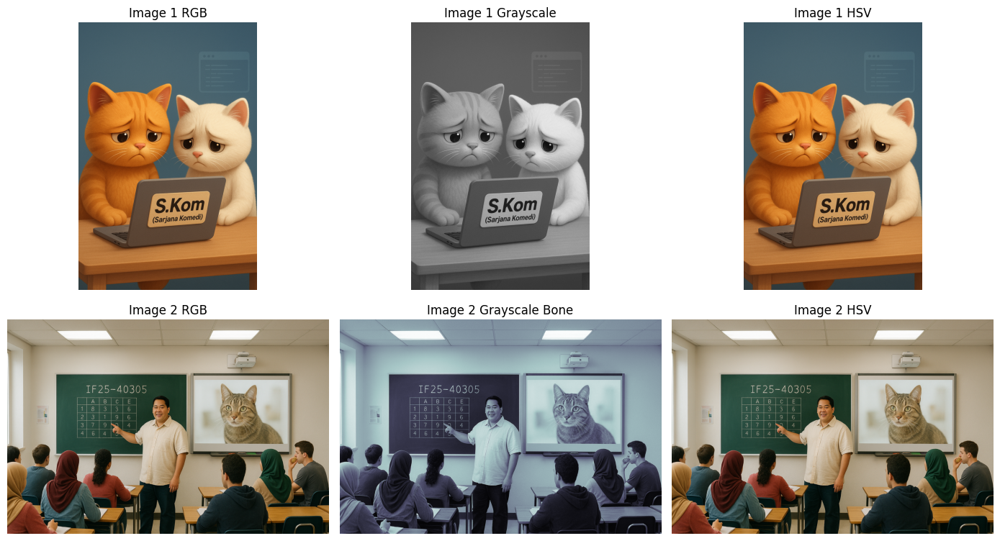

In [17]:
import cv2
import os
import matplotlib.pyplot as plt

# Path gambar
img_path = os.path.join(os.getcwd(), 'data', 'sample1.png')
img2_path = os.path.join(os.getcwd(), 'data', 'sample2.png')

# Membaca gambar
img = cv2.imread(img_path)
img2 = cv2.imread(img2_path)

# Konversi RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Konversi grayscale dan HSV
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
img2_hsv = cv2.cvtColor(img2, cv2.COLOR_BGR2HSV)

# Menampilkan hasil konversi
fig, axs = plt.subplots(2, 3, figsize=(14,8))

# Gambar pertama
axs[0,0].imshow(img_rgb)
axs[0,0].set_title("Image 1 RGB")
axs[0,0].axis('off')

axs[0,1].imshow(img_gray, cmap='gray')
axs[0,1].set_title("Image 1 Grayscale")
axs[0,1].axis('off')

axs[0,2].imshow(cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB))
axs[0,2].set_title("Image 1 HSV")
axs[0,2].axis('off')

# Gambar kedua
axs[1,0].imshow(img2_rgb)
axs[1,0].set_title("Image 2 RGB")
axs[1,0].axis('off')

axs[1,1].imshow(img2_gray, cmap='bone')
axs[1,1].set_title("Image 2 Grayscale Bone")
axs[1,1].axis('off')

axs[1,2].imshow(cv2.cvtColor(img2_hsv, cv2.COLOR_HSV2RGB))
axs[1,2].set_title("Image 2 HSV")
axs[1,2].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil dikonversi ke beberapa format warna yang berbeda, yaitu RGB, grayscale, dan HSV. Format RGB menampilkan warna asli gambar, sedangkan grayscale hanya menampilkan tingkat keabuan berdasarkan intensitas cahaya pada setiap piksel. Selain itu, format HSV memisahkan informasi warna berdasarkan hue, saturation, dan value sehingga tampilan warna pada gambar terlihat berbeda dari RGB. Pada gambar grayscale kedua digunakan colormap bone sehingga menghasilkan tampilan keabuan yang sedikit berbeda dari grayscale biasa. Hasil percobaan menunjukkan bahwa setiap format warna memiliki karakteristik tampilan yang berbeda sesuai dengan representasi warna yang digunakan pada citra digital.

### **Hands-On: 6. Memisahkan dan menampilkan channel warna.**

Pada sesi ini, kita akan memisahkan dan menampilkan channel warna.

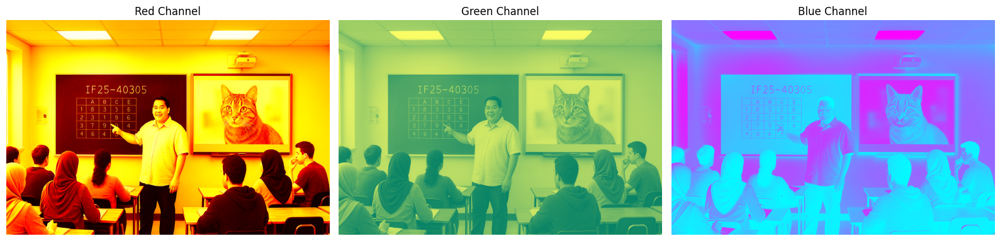

In [18]:
# Memisahkan channel warna RGB
red_channel = img2_rgb[:, :, 0]
green_channel = img2_rgb[:, :, 1]
blue_channel = img2_rgb[:, :, 2]

# Menampilkan channel warna
fig, axs = plt.subplots(1, 3, figsize=(16,5))

# Channel merah
axs[0].imshow(red_channel, cmap='hot')
axs[0].set_title("Red Channel")
axs[0].axis('off')

# Channel hijau
axs[1].imshow(green_channel, cmap='summer')
axs[1].set_title("Green Channel")
axs[1].axis('off')

# Channel biru
axs[2].imshow(blue_channel, cmap='cool')
axs[2].set_title("Blue Channel")
axs[2].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, citra RGB berhasil dipisahkan menjadi tiga channel warna, yaitu merah, hijau, dan biru. Setiap channel menampilkan intensitas warna masing-masing pada citra digital. Channel merah menunjukkan dominasi warna merah pada gambar, channel hijau menunjukkan intensitas warna hijau, sedangkan channel biru menunjukkan intensitas warna biru. Selain itu, penggunaan colormap yang berbeda pada setiap channel menghasilkan tampilan visual yang lebih beragam dibandingkan grayscale biasa. Hasil percobaan menunjukkan bahwa citra RGB tersusun dari kombinasi tiga channel warna utama yang dapat dianalisis secara terpisah.

**Latihan**

Mencoba memodifikasi gambar HSV kemudian mengembalikannya dengan RGB

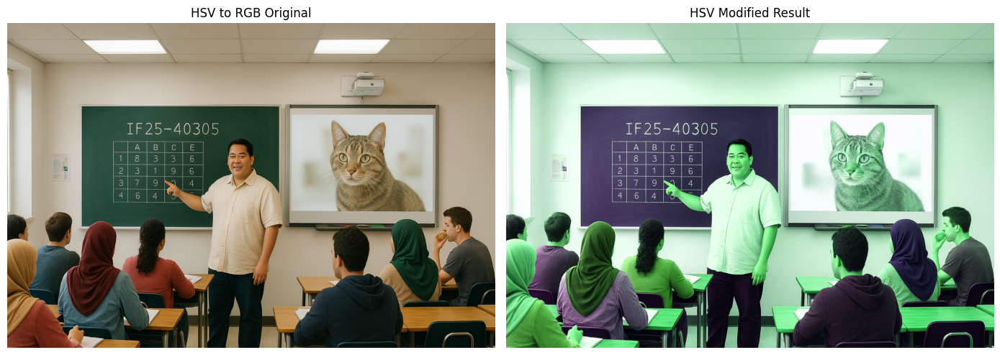

In [19]:
# Menyalin gambar HSV
img_hsv_edit = img2_hsv.copy().astype(np.float32)

# Modifikasi HSV
img_hsv_edit[:, :, 0] = (img_hsv_edit[:, :, 0] + 50) % 180
img_hsv_edit[:, :, 1] = np.clip(img_hsv_edit[:, :, 1] * 0.8, 0, 255)
img_hsv_edit[:, :, 2] = np.clip(img_hsv_edit[:, :, 2] * 1.3, 0, 255)

# Konversi kembali ke uint8
img_hsv_edit = img_hsv_edit.astype(np.uint8)

# Konversi HSV ke RGB
img_rgb_original = cv2.cvtColor(img2_hsv, cv2.COLOR_HSV2RGB)
img_rgb_edit = cv2.cvtColor(img_hsv_edit, cv2.COLOR_HSV2RGB)

# Menampilkan gambar
fig, axs = plt.subplots(1, 2, figsize=(14,6))

# Gambar asli
axs[0].imshow(img_rgb_original)
axs[0].set_title("HSV to RGB Original")
axs[0].axis('off')

# Gambar hasil modifikasi
axs[1].imshow(img_rgb_edit)
axs[1].set_title("HSV Modified Result")
axs[1].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar HSV berhasil dimodifikasi dengan mengubah nilai hue, saturation, dan value pada citra digital. Nilai hue diubah untuk menghasilkan pergeseran warna pada gambar, sedangkan saturation dikurangi sehingga warna terlihat lebih lembut. Selain itu, nilai value ditingkatkan sehingga gambar tampak lebih terang dibandingkan gambar asli. Setelah dilakukan modifikasi, gambar dikonversi kembali dari format HSV ke RGB agar dapat ditampilkan menggunakan Matplotlib. Hasil percobaan menunjukkan bahwa perubahan nilai HSV dapat memengaruhi warna, tingkat kejenuhan, dan kecerahan pada citra digital.

### **Hands-On: Manipulasi Piksel dan Dimensi Gambar**

Gambar digital adalah kumpulan piksel dengan nilai warna **RGB** (Red, Green, Blue) dalam rentang **0–255**.  
Kenapa 0–255? Karena format **8-bit per channel** memungkinkan 256 nilai unik (2⁸).  
- **0** = intensitas terendah (hitam).  
- **255** = intensitas tertinggi (putih).  

Setiap gambar memiliki atribut `.shape` yang menunjukkan dimensi: `(tinggi, lebar, channel)`.  
Contoh: `(1024, 1536, 3)` berarti gambar berwarna dengan 1024 piksel tinggi, 1536 piksel lebar, dan 3 channel warna.  

Mari kita eksplorasi lebih jauh dengan memanipulasi posisi dan orientasi piksel!


Shape gambar: (1024, 1536, 3)
Tinggi: 1024 piksel
Lebar: 1536 piksel
Jumlah channel: 3 (RGB)
Isi pixel_area:
 [[[163 154 134]
  [162 152 133]
  [167 159 137]
  [163 154 131]
  [160 149 130]]

 [[166 159 137]
  [165 158 137]
  [166 155 135]
  [167 155 135]
  [171 160 137]]

 [[164 157 137]
  [166 156 136]
  [166 154 136]
  [165 156 136]
  [168 159 136]]

 [[161 155 131]
  [159 150 131]
  [165 155 136]
  [164 156 136]
  [161 152 133]]

 [[161 152 131]
  [166 157 135]
  [164 157 137]
  [164 156 138]
  [161 151 132]]]


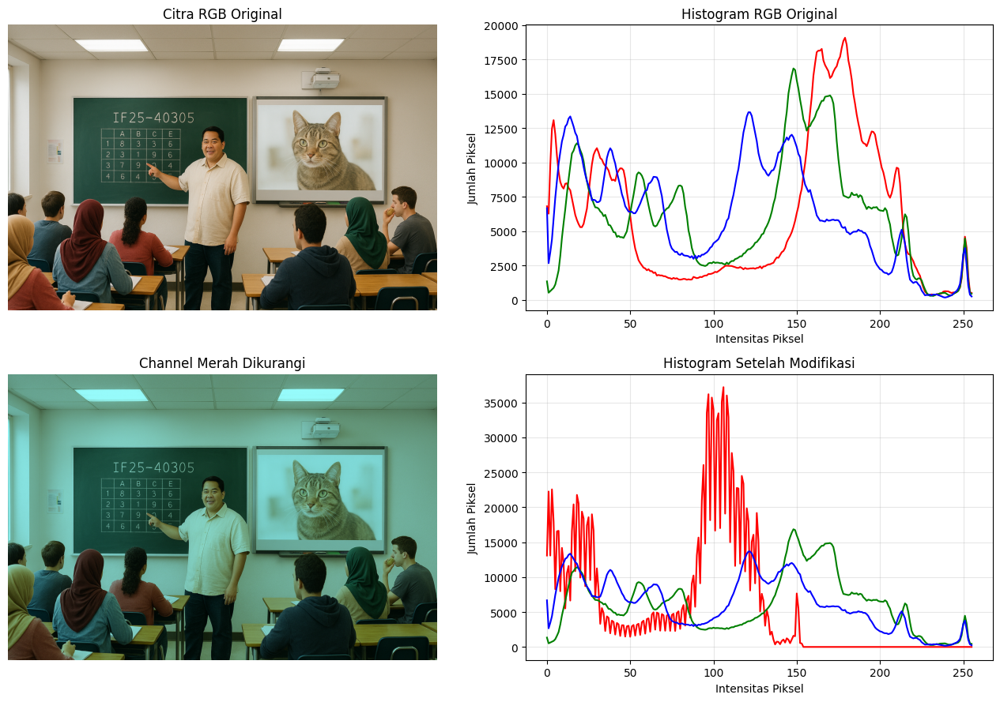


=== Penjelasan Histogram ===
Histogram digunakan untuk melihat distribusi intensitas warna RGB pada citra digital.


In [20]:
# Mengecek ukuran gambar
print("Shape gambar:", img2_rgb.shape)
print("Tinggi:", img2_rgb.shape[0], "piksel")
print("Lebar:", img2_rgb.shape[1], "piksel")
print("Jumlah channel:", img2_rgb.shape[2], "(RGB)")

# Mengambil sebagian piksel pojok kiri atas
pixel_area = img2_rgb[0:5, 0:5]
print("Isi pixel_area:\n", pixel_area)

# Modifikasi channel merah
img2_edit = img2_rgb.copy()
img2_edit[:,:,0] = (img2_edit[:,:,0] * 0.6).astype(np.uint8)

# Membuat layout
fig, axs = plt.subplots(2, 2, figsize=(13,9))

colors = ('r', 'g', 'b')

# Gambar asli
axs[0,0].imshow(img2_rgb)
axs[0,0].set_title("Citra RGB Original")
axs[0,0].axis('off')

# Histogram asli
for i, color in enumerate(colors):
    hist = cv2.calcHist([img2_rgb], [i], None, [256], [0,256])
    axs[0,1].plot(hist, color=color)

axs[0,1].set_title("Histogram RGB Original")
axs[0,1].set_xlabel("Intensitas Piksel")
axs[0,1].set_ylabel("Jumlah Piksel")
axs[0,1].grid(True, alpha=0.3)

# Gambar hasil modifikasi
axs[1,0].imshow(img2_edit)
axs[1,0].set_title("Channel Merah Dikurangi")
axs[1,0].axis('off')

# Histogram hasil modifikasi
for i, color in enumerate(colors):
    hist = cv2.calcHist([img2_edit], [i], None, [256], [0,256])
    axs[1,1].plot(hist, color=color)

axs[1,1].set_title("Histogram Setelah Modifikasi")
axs[1,1].set_xlabel("Intensitas Piksel")
axs[1,1].set_ylabel("Jumlah Piksel")
axs[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Penjelasan histogram
print("\n=== Penjelasan Histogram ===")
print("Histogram digunakan untuk melihat distribusi intensitas warna RGB pada citra digital.")

>>Dari hasil percobaan yang saya lakukan, citra digital berhasil dianalisis berdasarkan ukuran gambar, jumlah channel warna, dan distribusi intensitas piksel menggunakan histogram RGB. Selain itu, sebagian area piksel pada pojok kiri atas gambar juga berhasil ditampilkan untuk melihat nilai RGB pada citra. Selanjutnya dilakukan modifikasi dengan mengurangi intensitas channel merah sehingga tampilan gambar menjadi lebih sedikit warna kemerahannya. Perubahan tersebut memengaruhi bentuk histogram pada channel merah, di mana distribusi intensitas piksel menjadi lebih rendah dibandingkan sebelum dimodifikasi. Hasil percobaan menunjukkan bahwa perubahan nilai pada salah satu channel warna dapat memengaruhi tampilan visual dan distribusi warna pada citra digital.

### **Hands-On: Transformasi Posisi dan Orientasi Piksel**

Transformasi pada citra berarti **mengubah posisi, arah, atau ukuran piksel** menggunakan operasi matematis berbasis matriks.

#### **1. Translasi (Perpindahan)**

Menggeser seluruh piksel sejauh nilai tertentu pada sumbu x dan y.

➡ Tidak mengubah warna piksel, hanya posisinya.

➡ Area yang keluar dari batas gambar hilang, dan bagian kosong diisi warna latar.

#### **2. Rotasi (Perputaran)**

Memutar seluruh citra terhadap titik pusat.

➡ Mengubah orientasi gambar tanpa mengubah nilai warna.

➡ Dapat menimbulkan area kosong atau potongan di tepi gambar.

#### **3. Scaling (Penskalaan)**

Mengubah ukuran gambar dengan faktor `(s_x, s_y)`.

➡ Saat diperbesar, piksel lama direplikasi → detail menurun.

➡ Saat diperkecil, beberapa piksel digabung → sebagian data visual hilang.

➡ Scaling mempengaruhi **ketajaman dan jumlah informasi** dalam citra.

#### **4. Kombinasi Transformasi**

Beberapa transformasi dapat digabung secara berurutan.

➡ Urutan operasi berpengaruh pada hasil akhir.

➡ Secara matematis direpresentasikan melalui **perkalian matriks transformasi**.

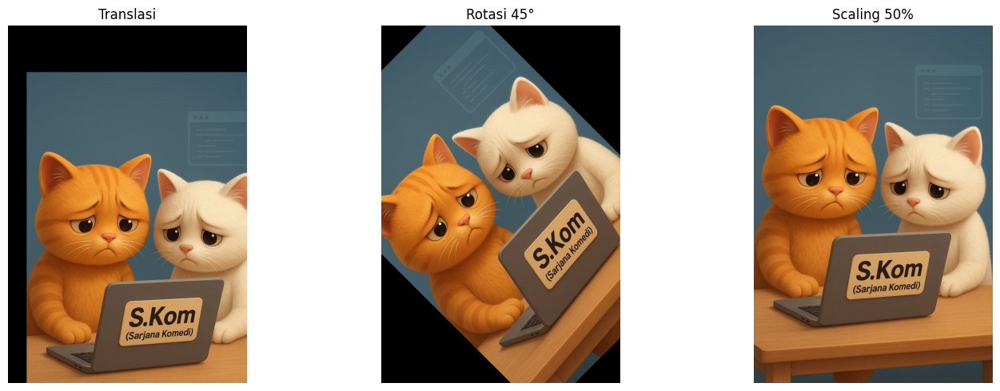

In [24]:
# Demo transformasi gambar: translasi, rotasi, dan scaling

rows, cols = img_rgb.shape[:2]

# Translasi gambar
M_translation = np.float32([
    [1, 0, 80],
    [0, 1, 200]
])

img_translation = cv2.warpAffine(
    img_rgb,
    M_translation,
    (cols, rows)
)

# Rotasi gambar
M_rotation = cv2.getRotationMatrix2D(
    (cols/2, rows/2),
    45,
    1
)

img_rotation = cv2.warpAffine(
    img_rgb,
    M_rotation,
    (cols, rows)
)

# Scaling gambar
img_scaling = cv2.resize(
    img_rgb,
    None,
    fx=0.5,
    fy=0.5
)

# Menampilkan hasil
fig, axs = plt.subplots(1, 3, figsize=(15,5))

# Translasi
axs[0].imshow(img_translation)
axs[0].set_title("Translasi")
axs[0].axis('off')

# Rotasi
axs[1].imshow(img_rotation)
axs[1].set_title("Rotasi 45°")
axs[1].axis('off')

# Scaling
axs[2].imshow(img_scaling)
axs[2].set_title("Scaling 50%")
axs[2].axis('off')

plt.tight_layout()
plt.show()

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil dimodifikasi menggunakan beberapa teknik transformasi citra, yaitu translasi, rotasi, dan scaling. Translasi dilakukan dengan menggeser posisi gambar ke arah kanan dan bawah menggunakan matriks translasi. Rotasi dilakukan dengan memutar gambar sebesar 45 derajat terhadap titik tengah gambar menggunakan matriks rotasi. Selain itu, scaling dilakukan dengan memperkecil ukuran gambar menjadi 50% dari ukuran aslinya menggunakan fungsi `cv2.resize()`. Hasil percobaan menunjukkan bahwa transformasi citra dapat digunakan untuk mengubah posisi, orientasi, dan ukuran gambar sesuai kebutuhan tanpa mengubah isi utama citra digital.

## **Transformasi & Anotasi**

Pada sesi ini, kita akan memutar gambar 45 derajat tanpa terpotong, menggeser objek, dan menambahkan anotasi visual.

### **Hands-On: Memutar Gambar Sebesar 45 Derajat Tanpa Memotong**

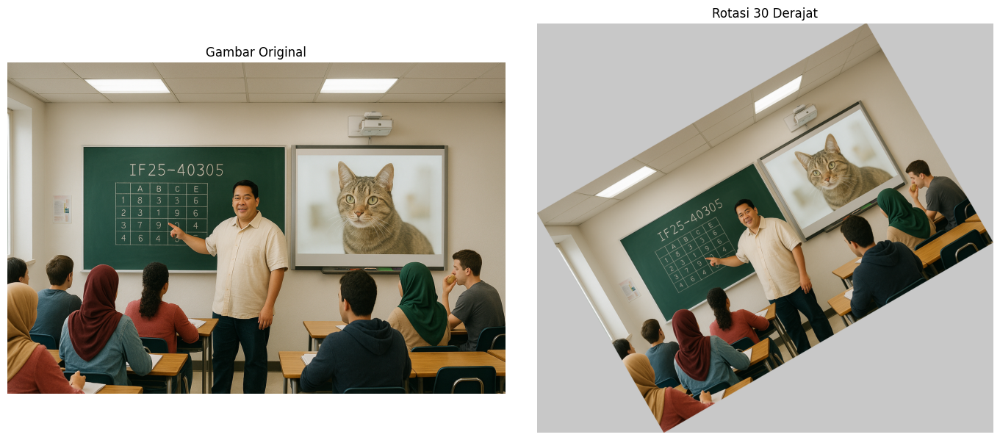

Sudut rotasi: 30 derajat
Ukuran canvas baru: 1842 x 1654 piksel


In [23]:
# Mengambil ukuran gambar
rows, cols = img2_rgb.shape[:2]

# Menyalin gambar asli
img_original = img2_rgb.copy()

# Rotasi gambar 30 derajat
angle = 30

# Matriks rotasi
M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)

# Menghitung ukuran canvas baru
cos = np.abs(M[0,0])
sin = np.abs(M[0,1])

new_width = int((rows * sin) + (cols * cos))
new_height = int((rows * cos) + (cols * sin))

# Menyesuaikan posisi gambar
M[0,2] += (new_width / 2) - cols/2
M[1,2] += (new_height / 2) - rows/2

# Rotasi gambar dengan background abu-abu
img_rotate = cv2.warpAffine(
    img2_rgb,
    M,
    (new_width, new_height),
    borderValue=(200, 200, 200)
)

# Menampilkan gambar
fig, axs = plt.subplots(1, 2, figsize=(14,6))

# Gambar asli
axs[0].imshow(img_original)
axs[0].set_title("Gambar Original")
axs[0].axis('off')

# Gambar hasil rotasi
axs[1].imshow(img_rotate)
axs[1].set_title("Rotasi 30 Derajat")
axs[1].axis('off')

plt.tight_layout()
plt.show()

# Informasi
print(f"Sudut rotasi: {angle} derajat")
print(f"Ukuran canvas baru: {new_width} x {new_height} piksel")

>>Dari hasil percobaan yang saya lakukan, gambar digital berhasil diputar menggunakan teknik rotasi dengan sudut 30 derajat. Proses rotasi dilakukan menggunakan fungsi `cv2.getRotationMatrix2D()` untuk membuat matriks rotasi dan `cv2.warpAffine()` untuk menghasilkan gambar yang telah diputar. Selain itu, dilakukan penyesuaian ukuran canvas agar seluruh bagian gambar tetap terlihat dan tidak terpotong setelah proses rotasi. Background pada area kosong hasil rotasi diisi dengan warna abu-abu sehingga tampilan gambar menjadi lebih jelas. Hasil percobaan menunjukkan bahwa teknik rotasi dapat digunakan untuk mengubah orientasi citra digital dengan sudut tertentu tanpa menghilangkan isi utama gambar.

### **Hands-On: Menggeser Posisi Objek di dalam Gambar**

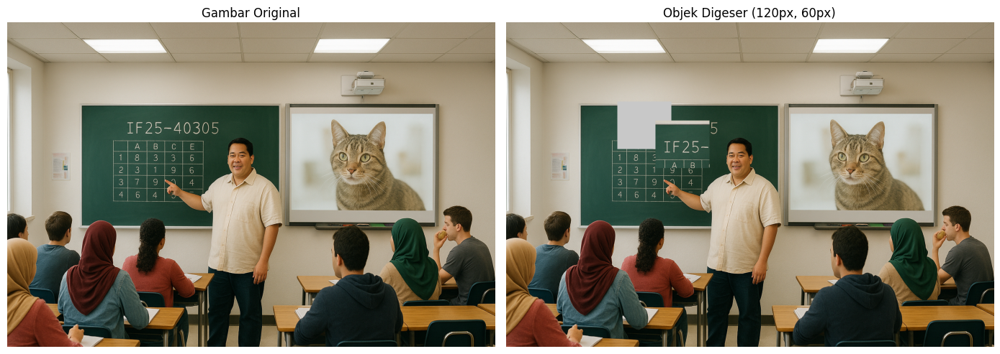

Posisi awal objek: y=250:400, x=350:520
Posisi baru objek: y=310:460, x=470:640


In [22]:
# Mengambil objek dari gambar
object_img = img2_rgb[250:400, 350:520].copy()

# Menyalin background gambar
background = img2_rgb.copy()

# Menghapus area objek lama dengan warna abu-abu
background[250:400, 350:520] = [200, 200, 200]

# Menggeser objek
shift_x, shift_y = 120, 60

background[
    250+shift_y:400+shift_y,
    350+shift_x:520+shift_x
] = object_img

# Menampilkan gambar
fig, axs = plt.subplots(1, 2, figsize=(14,5))

# Gambar asli
axs[0].imshow(img2_rgb)
axs[0].set_title("Gambar Original")
axs[0].axis('off')

# Gambar hasil pergeseran objek
axs[1].imshow(background)
axs[1].set_title(f"Objek Digeser ({shift_x}px, {shift_y}px)")
axs[1].axis('off')

plt.tight_layout()
plt.show()

print(f"Posisi awal objek: y=250:400, x=350:520")
print(f"Posisi baru objek: y={250+shift_y}:{400+shift_y}, x={350+shift_x}:{520+shift_x}")

>>Dari hasil percobaan yang saya lakukan, objek pada citra digital berhasil dipindahkan ke posisi baru menggunakan manipulasi koordinat piksel. Objek diambil dari area tertentu pada gambar kemudian area asli objek dihapus dengan warna abu-abu agar terlihat perbedaannya. Selanjutnya objek ditempatkan kembali pada posisi baru dengan menambahkan nilai pergeseran pada koordinat x dan y. Hasil percobaan menunjukkan bahwa perubahan koordinat piksel dapat digunakan untuk memindahkan objek pada citra digital tanpa mengubah bentuk objek tersebut.

### **Hands-On: Pengenalan Fungsi Menggambar**

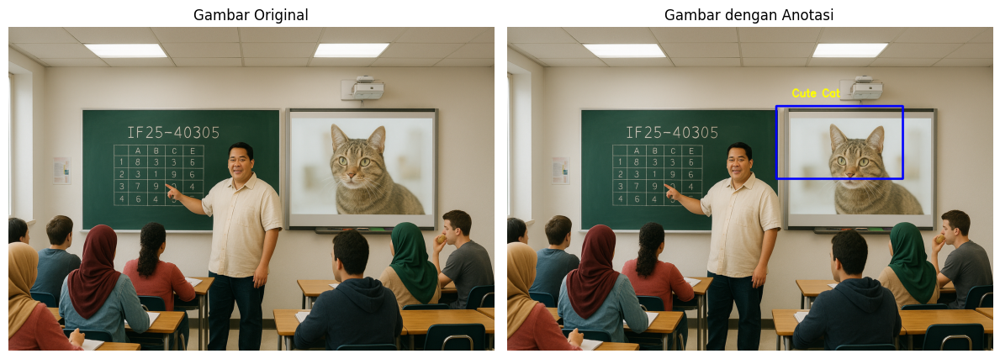

Rectangle biru dibuat pada area tertentu dengan ketebalan 5 piksel
Text 'Cute Cat' ditambahkan di bagian atas gambar


In [21]:
# Membuat anotasi pada gambar
img_annotation = img2_rgb.copy()

# Menambahkan rectangle biru
cv2.rectangle(img_annotation,
              (850, 250),
              (1250, 480),
              (0, 0, 255),
              5)

# Menambahkan teks
cv2.putText(img_annotation,
            'Cute Cat',
            (900, 220),
            cv2.FONT_HERSHEY_SIMPLEX,
            1.1,
            (255, 255, 0),
            3)

# Menampilkan gambar
fig, axs = plt.subplots(1, 2, figsize=(12,5))

# Gambar asli
axs[0].imshow(img2_rgb)
axs[0].set_title("Gambar Original")
axs[0].axis('off')

# Gambar anotasi
axs[1].imshow(img_annotation)
axs[1].set_title("Gambar dengan Anotasi")
axs[1].axis('off')

plt.tight_layout()
plt.show()

print("Rectangle biru dibuat pada area tertentu dengan ketebalan 5 piksel")
print("Text 'Cute Cat' ditambahkan di bagian atas gambar")

>>Dari hasil percobaan yang saya lakukan, citra digital berhasil dimodifikasi dengan menambahkan anotasi berupa rectangle dan teks pada gambar. Rectangle ditambahkan pada area tertentu untuk menandai objek pada citra, sedangkan teks digunakan sebagai label tambahan pada gambar. Proses anotasi dilakukan menggunakan fungsi `cv2.rectangle()` dan `cv2.putText()` pada OpenCV. Hasil percobaan menunjukkan bahwa anotasi dapat digunakan untuk memberikan informasi tambahan dan menandai bagian tertentu pada citra digital sehingga gambar menjadi lebih informatif.